In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.interpolate as intpol
import time

In [2]:
%matplotlib inline

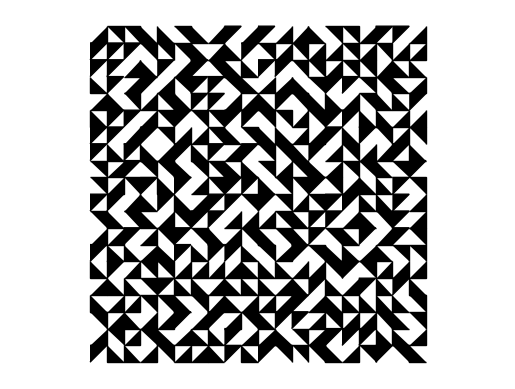

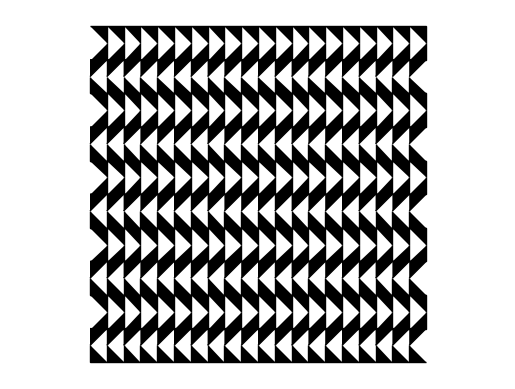

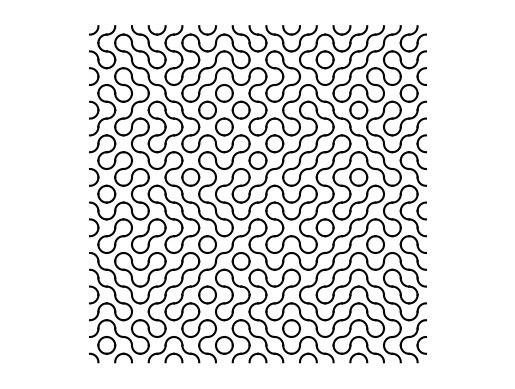

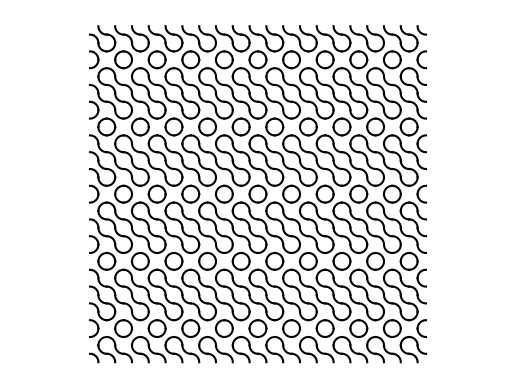

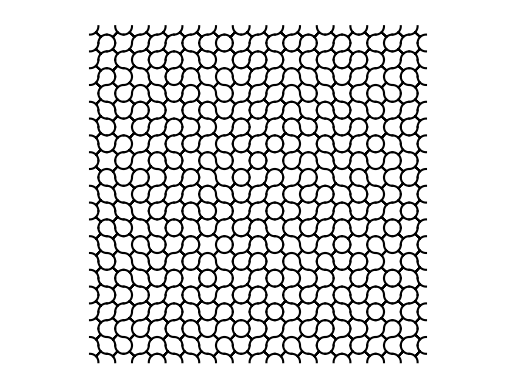

In [3]:
 
from matplotlib.patches import Polygon
from matplotlib import pyplot as plt
from random import choice
from itertools import cycle
from math import cos, sin, radians as rad

class Truchet:
    #  locations defined as:
    #  a           b
    #  -------------
    #  |           |
    #  |  center   |
    #  |           |
    #  -------------
    #  c           d
    #
    def __init__(self, xcenter, ycenter, style):
        self.a, self.b, self.c, self.d = [xcenter-.5, ycenter+.5],[xcenter+.5, ycenter+.5],  [xcenter-.5, ycenter-.5], [xcenter+.5, ycenter-.5]
        if style == 'lowleft':
            self.p = [self.a, self.c, self.d]
        if style == 'lowright':
            self.p = [self.c, self.d, self.b]
        if style == 'upleft':
            self.p = [self.a, self.b, self.c]
        if style == 'upright':
            self.p = [self.a, self.b, self.d]
    def return_tile(self):
        return Polygon(self.p, closed=False, color='k')

class Truchet2:    
    #  modified truchet using 2 arcs
    def __init__(self, xcenter, ycenter, style):
        self.a, self.b, self.c, self.d = [xcenter-.5, ycenter+.5],[xcenter+.5, ycenter+.5],  [xcenter-.5, ycenter-.5], [xcenter+.5, ycenter-.5]
        if style == 1:  #upper right and lower left arcs
            #first upper right
            x = [self.b[0] + cos(rad(i))/2. for i in range(180, 271)]
            y = [self.b[1] + sin(rad(i))/2. for i in range(180, 271)]
            self.p1 = [x,y]
            #now lower left
            x = [self.c[0] + cos(rad(i))/2. for i in range(0, 91)]
            y = [self.c[1] + sin(rad(i))/2. for i in range(0, 91)]
            self.p2 = [x,y]
        if style == 2:  #upper left and lower right arcs
            #first upper left
            x = [self.a[0] + cos(rad(i))/2. for i in range(270, 361)]
            y = [self.a[1] + sin(rad(i))/2. for i in range(270, 361)]
            self.p1 = [x,y]
            #now lower right
            x = [self.d[0] + cos(rad(i))/2. for i in range(90, 181)]
            y = [self.d[1] + sin(rad(i))/2. for i in range(90, 181)]
            self.p2 = [x,y]
    def return_coords(self):
        return self.p1, self.p2

class Truchet3:    
    #  modified truchet using 2 arcs
    def __init__(self, xcenter, ycenter, style):
        self.a, self.b, self.c, self.d = [xcenter-.5, ycenter+.5],[xcenter+.5, ycenter+.5],  [xcenter-.5, ycenter-.5], [xcenter+.5, ycenter-.5]
        if style == 1:  #upper right and lower left arcs
            #first upper right
            x = [self.b[0] + cos(rad(i))/2. for i in range(180, 271)]
            y = [self.b[1] + sin(rad(i))/2. for i in range(180, 271)]
            x[44] = xcenter
            y[44] = ycenter
            self.p1 = [x,y]
            #now lower left
            x = [self.c[0] + cos(rad(i))/2. for i in range(0, 91)]
            y = [self.c[1] + sin(rad(i))/2. for i in range(0, 91)]
            x[44] = xcenter
            y[44] = ycenter
            self.p2 = [x,y]
        if style == 2:  #upper left and lower right arcs
            #first upper left
            x = [self.a[0] + cos(rad(i))/2. for i in range(270, 361)]
            y = [self.a[1] + sin(rad(i))/2. for i in range(270, 361)]
            x[44] = xcenter
            y[44] = ycenter
            self.p1 = [x,y]
            #now lower right
            x = [self.d[0] + cos(rad(i))/2. for i in range(90, 181)]
            y = [self.d[1] + sin(rad(i))/2. for i in range(90, 181)]
            x[44] = xcenter
            y[44] = ycenter
            self.p2 = [x,y]
    def return_coords(self):
        return self.p1, self.p2

ax = plt.gca()
for i in range(20):
    #plt.axhline(i-.5)
    #plt.axvline(i-.5)
    for j in range(20):
        #random
        a = Truchet(i, j, choice(['lowleft', 'lowright', 'upleft', 'upright'])).return_tile()
        ax.add_patch(a)

#ax.set_xlim(-2,21)
#ax.set_ylim(-2,21)  
plt.axis('equal')
plt.axis('off')
plt.show()


ax = plt.gca()
c = cycle(['lowleft',  'upleft', 'lowright',  'upright'])
for i in range(20):
    for j in range(20):
        a = Truchet(i, j, next(c)).return_tile()
        ax.add_patch(a)

#ax.set_xlim(-2,21)
#ax.set_ylim(-2,21)  
plt.axis('equal')
plt.axis('off')
plt.show()
ax = plt.gca()

for i in range(20):
    #plt.axhline(i-.5)
    #plt.axvline(i-.5)
    for j in range(20):
        p1, p2 = Truchet2(i,j,choice([1,2])).return_coords()
        plt.plot(p1[0], p1[1], color='k')
        plt.plot(p2[0], p2[1], color='k')
#plt.xlim(0,20)
#plt.ylim(0,20)
plt.axis('equal')
plt.axis('off')
plt.show()


c = cycle([1,2,1,1,1,1,2,1])
for i in range(20):
    for j in range(20):
        p1, p2 = Truchet2(i,j, next(c)).return_coords()
        plt.plot(p1[0], p1[1], color='k')
        plt.plot(p2[0], p2[1], color='k')
#plt.xlim(0,20)
#plt.ylim(0,20)
plt.axis('equal')
plt.axis('off')
plt.show()


for i in range(20):
    #plt.axhline(i-.5)
    #plt.axvline(i-.5)
    for j in range(20):
        p1, p2 = Truchet3(i,j,choice([1,2])).return_coords()
        plt.plot(p1[0], p1[1], color='k')
        plt.plot(p2[0], p2[1], color='k')
#plt.xlim(0,20)
#plt.ylim(0,20)
plt.axis('equal')
plt.axis('off')
plt.show()


In [1]:
class Truchet2:    
    #  modified truchet using 2 arcs
    def __init__(self, xcenter, ycenter, style):
        self.a, self.b, self.c, self.d = [xcenter-.5, ycenter+.5],[xcenter+.5, ycenter+.5],  [xcenter-.5, ycenter-.5], [xcenter+.5, ycenter-.5]
        if style == 1:  #upper right and lower left arcs
            #first upper right
            x = [self.b[0] + cos(rad(i))/2. for i in range(180, 271)]
            y = [self.b[1] + sin(rad(i))/2. for i in range(180, 271)]
            self.p1 = [x,y]
            #now lower left
            x = [self.c[0] + cos(rad(i))/2. for i in range(0, 91)]
            y = [self.c[1] + sin(rad(i))/2. for i in range(0, 91)]
            self.p2 = [x,y]
        if style == 2:  #upper left and lower right arcs
            #first upper left
            x = [self.a[0] + cos(rad(i))/2. for i in range(270, 361)]
            y = [self.a[1] + sin(rad(i))/2. for i in range(270, 361)]
            self.p1 = [x,y]
            #now lower right
            x = [self.d[0] + cos(rad(i))/2. for i in range(90, 181)]
            y = [self.d[1] + sin(rad(i))/2. for i in range(90, 181)]
            self.p2 = [x,y]
    def return_coords(self):
        return self.p1, self.p2


In [145]:
np.shape(style_A_x)

(2, 2, 40)

In [3]:
def generate_perlin_noise_2d(shape, res):
    def f(t):
        return 6*t**5 - 15*t**4 + 10*t**3
    
    delta = (res[0] / shape[0], res[1] / shape[1])
    d = (shape[0] // res[0], shape[1] // res[1])
    grid = np.mgrid[0:res[0]:delta[0],0:res[1]:delta[1]].transpose(1, 2, 0) % 1
    # Gradients
    angles = 2*np.pi*np.random.rand(res[0]+1, res[1]+1)
    gradients = np.dstack((np.cos(angles), np.sin(angles)))
    g00 = gradients[0:-1,0:-1].repeat(d[0], 0).repeat(d[1], 1)
    g10 = gradients[1:  ,0:-1].repeat(d[0], 0).repeat(d[1], 1)
    g01 = gradients[0:-1,1:  ].repeat(d[0], 0).repeat(d[1], 1)
    g11 = gradients[1:  ,1:  ].repeat(d[0], 0).repeat(d[1], 1)
    # Ramps
    n00 = np.sum(np.dstack((grid[:,:,0]  , grid[:,:,1]  )) * g00, 2)
    n10 = np.sum(np.dstack((grid[:,:,0]-1, grid[:,:,1]  )) * g10, 2)
    n01 = np.sum(np.dstack((grid[:,:,0]  , grid[:,:,1]-1)) * g01, 2)
    n11 = np.sum(np.dstack((grid[:,:,0]-1, grid[:,:,1]-1)) * g11, 2)
    # Interpolation
    t = f(grid)
    n0 = n00*(1-t[:,:,0]) + t[:,:,0]*n10
    n1 = n01*(1-t[:,:,0]) + t[:,:,0]*n11
    return np.sqrt(2)*((1-t[:,:,1])*n0 + t[:,:,1]*n1)
        
def generate_fractal_noise_2d(shape, res, octaves=1, persistence=0.5):
    noise = np.zeros(shape)
    frequency = 1
    amplitude = 1
    for _ in range(octaves):
        noise += amplitude * generate_perlin_noise_2d(shape, (frequency*res[0], frequency*res[1]))
        frequency *= 2
        amplitude *= persistence
    return noise


In [4]:
class Gen_Truchet:
    def __init__(self, style_x,style_y, order,join=0):
        size=order.shape[0]
        n_pt=np.shape(style_x[0])[1]
        n_motif=np.shape(style_x)[0]
        n_crve=np.shape(style_x[0])[0]
        self.style_x=np.zeros(np.shape(style_x))+style_x
        self.style_y=np.zeros(np.shape(style_x))+style_y
        
        #print((self.style_x,style_x))
        ##assertion np.shape(style_x)==np.shape(style_y)
        ##assertion np.any(order)!>np.shape(style_x)[0]
        order=order%(np.shape(style_x)[0])
        k=order[0][0]
        for i in range(n_motif):
            self.style_x[i][:,n_pt//2]=self.style_x[i][:,n_pt//2]*(1-join)+(join)*1
            self.style_y[i][:,n_pt//2]=self.style_y[i][:,n_pt//2]*(1-join)+(join)*1
        tru_x=np.zeros(np.shape(self.style_x[k]))+self.style_x[k]
        tru_y=np.zeros(np.shape(self.style_y[k]))+self.style_y[k]
        for i in range(1,size**2):              
            k=order[i%size][i//size]
            tru_x=np.vstack((tru_x,self.style_x[k]+2*(i//size)))
            tru_y=np.vstack((tru_y,self.style_y[k]+2*(i%size)))
            
        self.truchet_x=tru_x
        self.truchet_y=tru_y
        
    def get_coords(self):
        return self.truchet_x,self.truchet_y
  

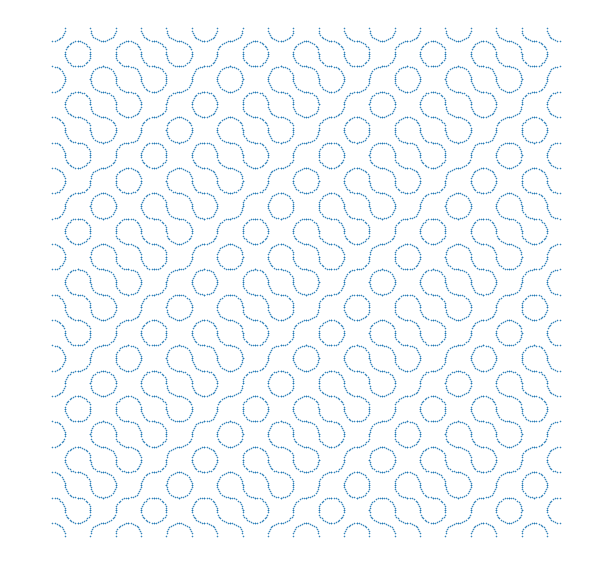

In [294]:
plt.figure(figsize=(10,10))
size=20
order=((np.arange(size**2).reshape(size,size))**3%7)%2
##assertion np.shape(style_x)==np.shape(style_y)
##assertion np.any(order)!>np.shape(style_x)[0]        
k=order[0][0]
tru_x=style_A_x[0]
tru_y=style_A_y[0]
for i in range(1,size**2):              
    k=order[i%size][i//size]
    tru_x=np.vstack((tru_x,style_A_x[k]+2*(i//size)))
    tru_y=np.vstack((tru_y,style_A_y[k]+2*(i%size)))

#Truchet_x,Truchet_y=Gen_Truchet(style_A_x,style_A_y, order, convexity=1,join=0).get_coords()
#plt.plot(tru_x.T,tru_y.T)
plt.scatter(tru_x.T,tru_y.T,s=0.3)
plt.axis('equal')
plt.axis('off')
plt.show()


In [5]:
plt.rcParams['axes.facecolor'] = 'black'
plt.rcParams['figure.facecolor'] = 'black'

In [65]:
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'

C:\Users\jhash\AppData\Local\Temp\ipykernel_16896\974414798.py:30: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  style_A_x=np.asarray(style_A_x)
C:\Users\jhash\AppData\Local\Temp\ipykernel_16896\974414798.py:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  style_A_y=np.asarray(style_A_y)


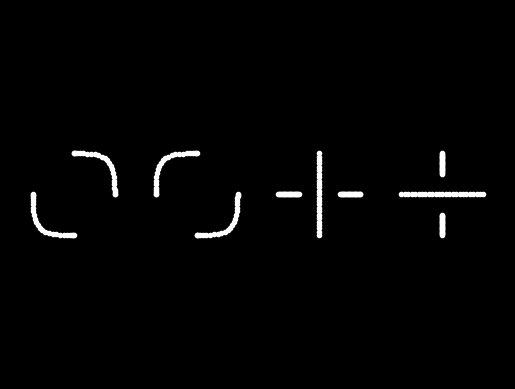

In [8]:

N=25
s=np.sin(np.linspace(0,0.5*np.pi,N,endpoint=True))
c=np.cos(np.linspace(0,0.5*np.pi,N,endpoint=True))
a1=np.ones(N)
b1=np.linspace(0,2,N,endpoint=True)
a2=np.linspace(0,0.5,N,endpoint=True)
a3=np.linspace(1.5,2,N,endpoint=True)
b2=np.ones(N)
b3=np.ones(N)
style_A_x=[]
style_A_y=[]
# T_x=np.vstack((s,2-s))
# T_y=np.vstack((c,2-c))
# style_A_x.append(T_x)
# style_A_y.append(T_y)
# T_x=np.vstack((2-c,c))
# T_y=np.vstack((s,2-s))
# style_A_x.append(T_x)
# style_A_y.append(T_y)

exp=5
#exp=2**(np.sin(1*np.linspace(0,2*np.pi,N,endpoint=True) ) )
#exp=np.logspace(-2,1,N,endpoint=True)
#exp=np.linspace(0.5,2,N,endpoint=True)
style_A_x.extend(  (  np.vstack((s**exp,2-s**exp)),np.vstack((2-c**exp,c**exp)),np.vstack((a1,a2,a3)),np.vstack((b1,b2,b3))  )  )
style_A_y.extend(  (  np.vstack((c**exp,2-c**exp)),np.vstack((s**exp,2-s**exp)),np.vstack((b1,b2,b3)),np.vstack((a1,a2,a3))  )  )
# style_A_x.extend(  (  np.vstack((s**exp,2-s**exp)),np.vstack((2-c**exp,c**exp))  )  )
# style_A_y.extend(  (  np.vstack((c**exp,2-c**exp)),np.vstack((s**exp,2-s**exp))  )  )

style_A_x=np.asarray(style_A_x)
style_A_y=np.asarray(style_A_y)
for i in range(np.shape(style_A_x)[0]):
    plt.plot(style_A_x[i].T+i*3,style_A_y[i].T,'.',color='w')

#plt.plot(2-((2-style_A_x[0][1].T)**2),2-(2-style_A_y[0][1].T)**2,color='black')
#plt.plot([1,1],[0,2],'--',[0,2],[1,1],'--',color='white')
plt.axis('equal')
plt.axis('off')
plt.show()

In [653]:
#np.vstack((s**exp,2-s**exp))

In [7]:
# from matplotlib import colors
# color_list_gold=['#FFE964','#BA7322','#FFDC6D','#FFFFB5','#FCFDF6','#FFFF9C','#FDDC53','#D49721','#BB6E03','#5B1F03']
# #color_list_gold=['#FFE964','#BA7322','#8B3E04','#FFDC6D','#FFFFB5','#FCFDF6','#FFFF9C','#FDDC53','#D49721','#BB6E03','#5B1F03']
# norm=plt.Normalize(-2,2)
# gold = colors.LinearSegmentedColormap.from_list("", color_list_gold)

from matplotlib import colors
color_list_gold_1=['#FFE964','#BA7322','#FFDC6D','#FFFFB5','#FCFDF6','#FFFF9C','#FDDC53','#D49721','#BB6E03','#5B1F03']
color_list_gold_cyclic=['#FFE964','#BA7322','#FFDC6D','#FFFFB5','#FCFDF6','#FFFF9C','#FDDC53','#D49721','#BB6E03','#5B1F03','#BB6E03','#D49721','#FDDC53','#FFFF9C','#FCFDF6','#FFFFB5','#FFDC6D','#BA7322','#FFE964']
color_list_gold_2=['#FFE964','#BA7322','#8B3E04','#FFDC6D','#FFFFB5','#FCFDF6','#FFFF9C','#FDDC53','#D49721','#BB6E03','#5B1F03']
norm=plt.Normalize(-2,2)
gold_1 = colors.LinearSegmentedColormap.from_list("", color_list_gold_1)
gold_2 = colors.LinearSegmentedColormap.from_list("", color_list_gold_2)

gold_cyclic = colors.LinearSegmentedColormap.from_list("", color_list_gold_cyclic)


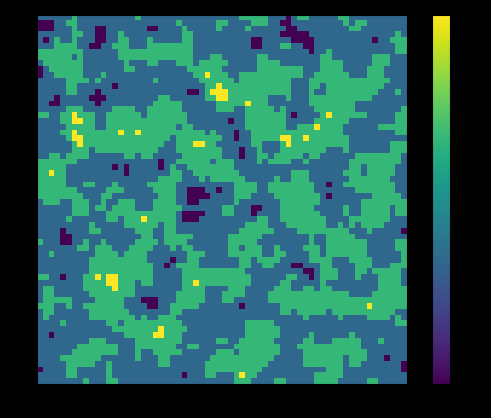

In [218]:
plt.imshow(gen_order(2**6,2**3,0.8))
plt.colorbar()
plt.show()

In [206]:
def gen_order(N,M,mix,seed=0,octaves=4,persistence=0.7,f=10):
    np.random.seed(seed)
    noise1 = generate_fractal_noise_2d((N, N), (M, M),octaves=4,persistence=0.7)
    m1 = (intpol.interp1d([np.min(noise1),np.max(noise1)],[0,1]))
    noise1=m1(noise1)
    nn=np.arange(N**2).reshape(N,N)
    noise2=((nn//N-N//2)**2+(nn%N-N//2)**2)**0.5/(2*N)
    noise2=np.sin(f*noise2)
    m2 = (intpol.interp1d([np.min(noise2),np.max(noise2)],[0,1]))
    noise2=m2(noise2)
    noise=mix*noise1+(1-mix)*noise2
    m = (intpol.interp1d([np.min(noise),np.max(noise)],[0,3]))
    order=np.round(m(noise)).astype(int)
    return order

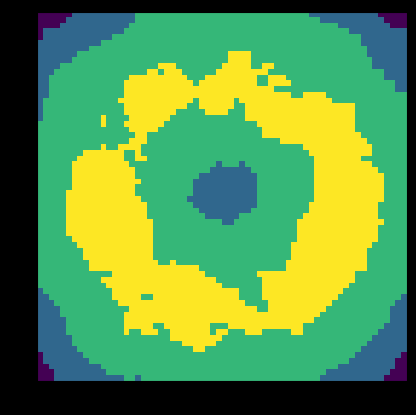

In [222]:
order=gen_order(N,2**2,0.2,seed)
plt.imshow(order)

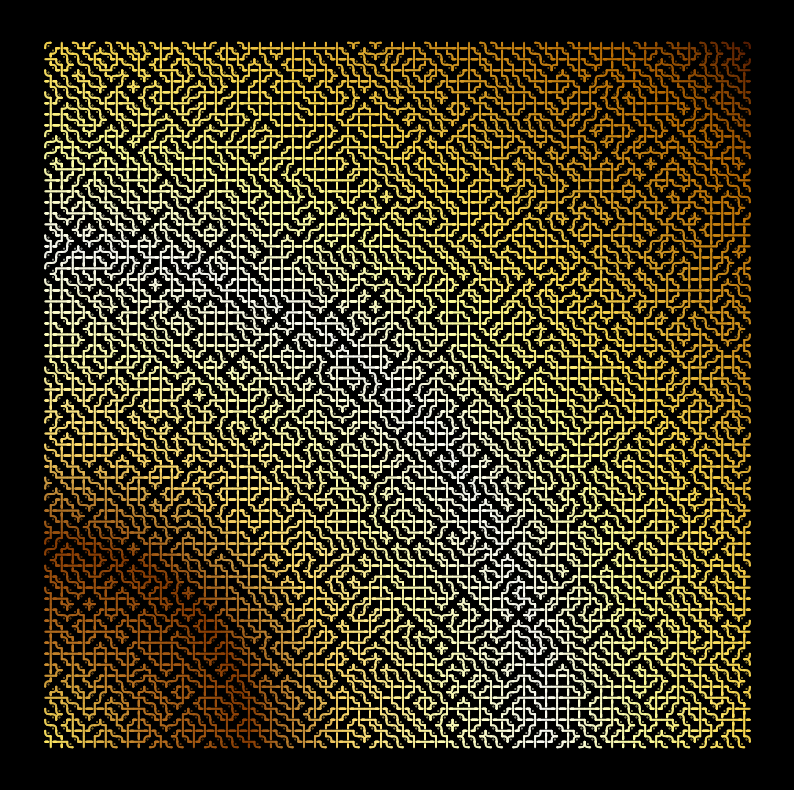

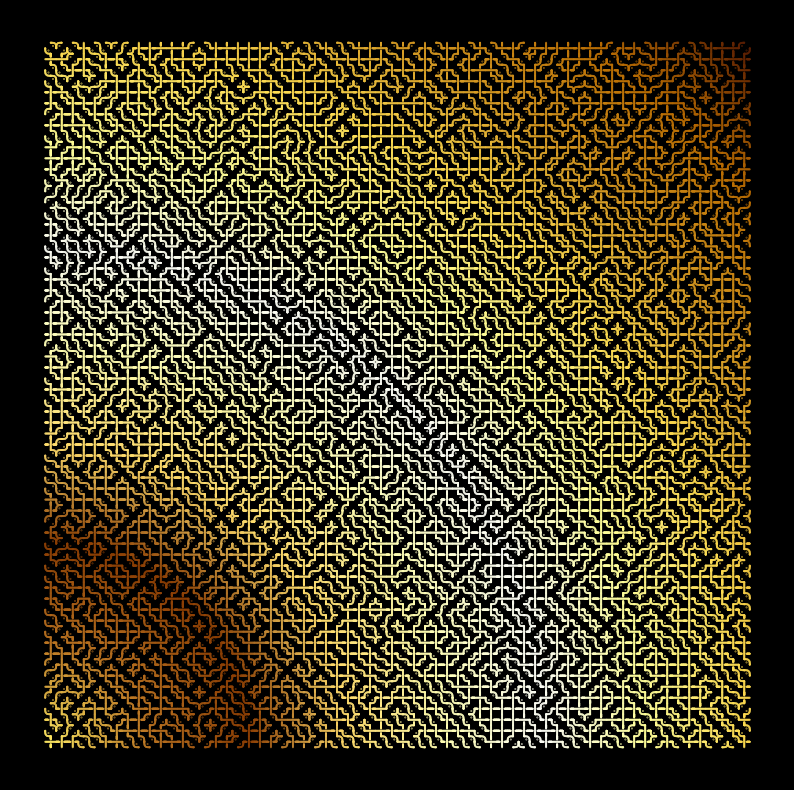

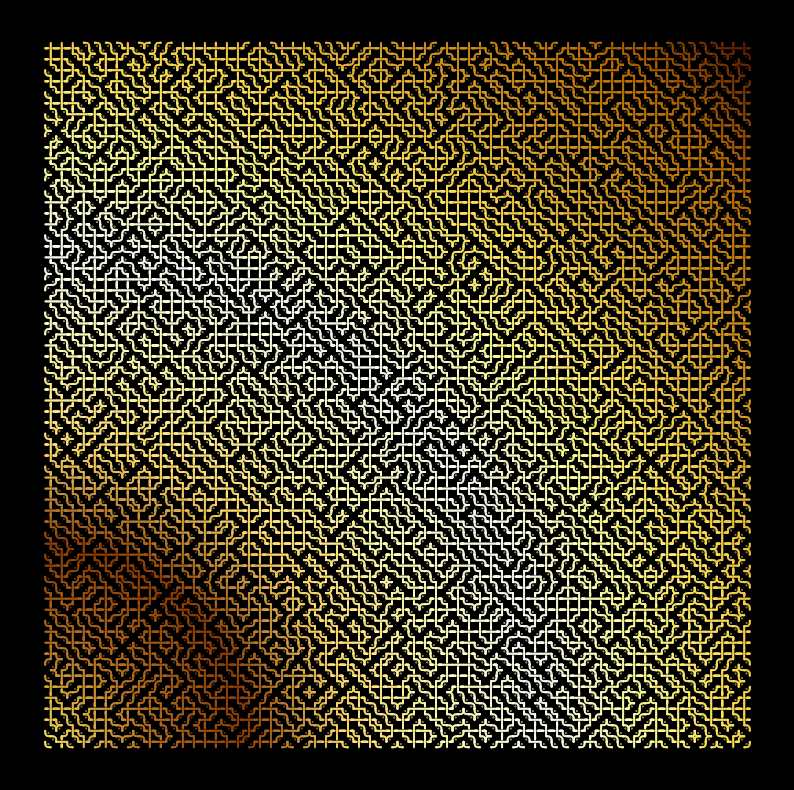

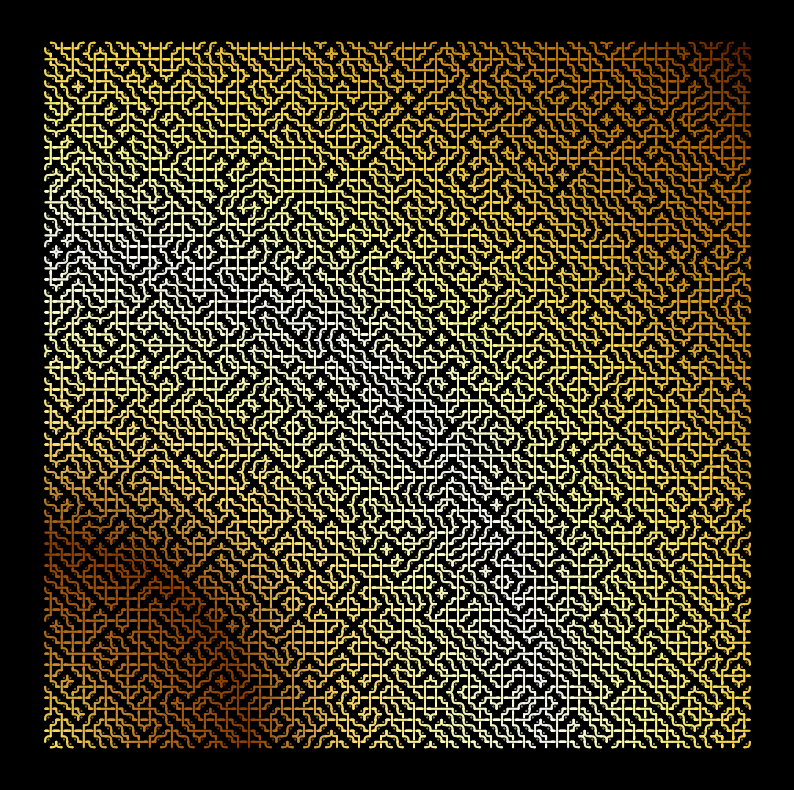

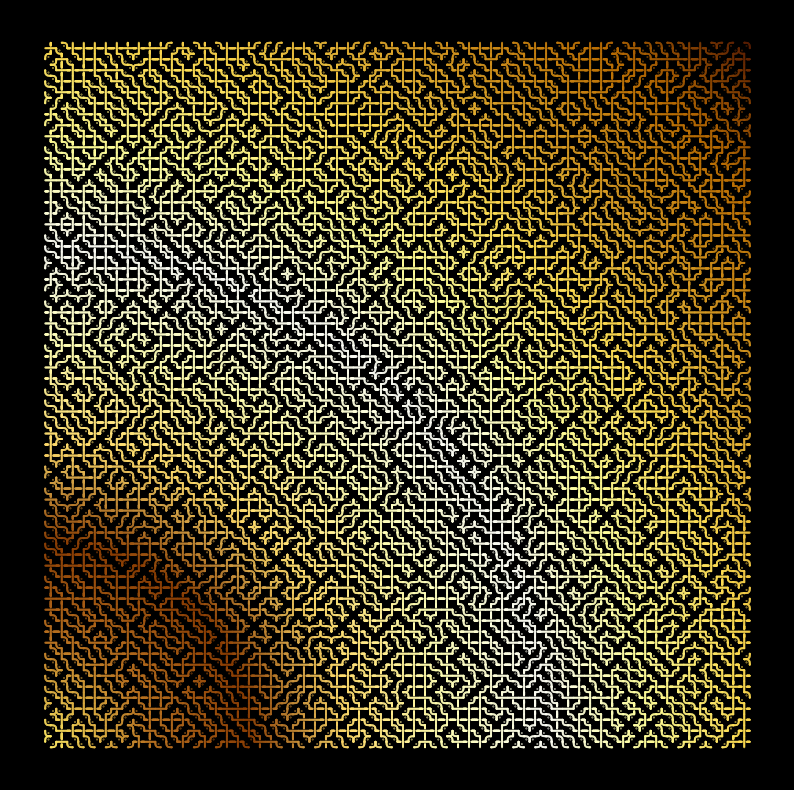

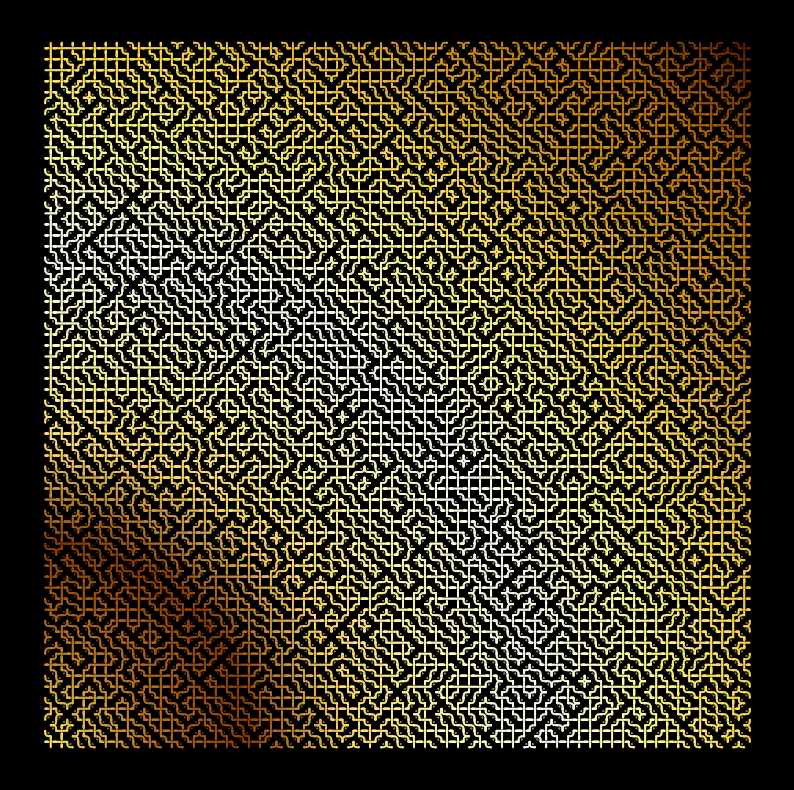

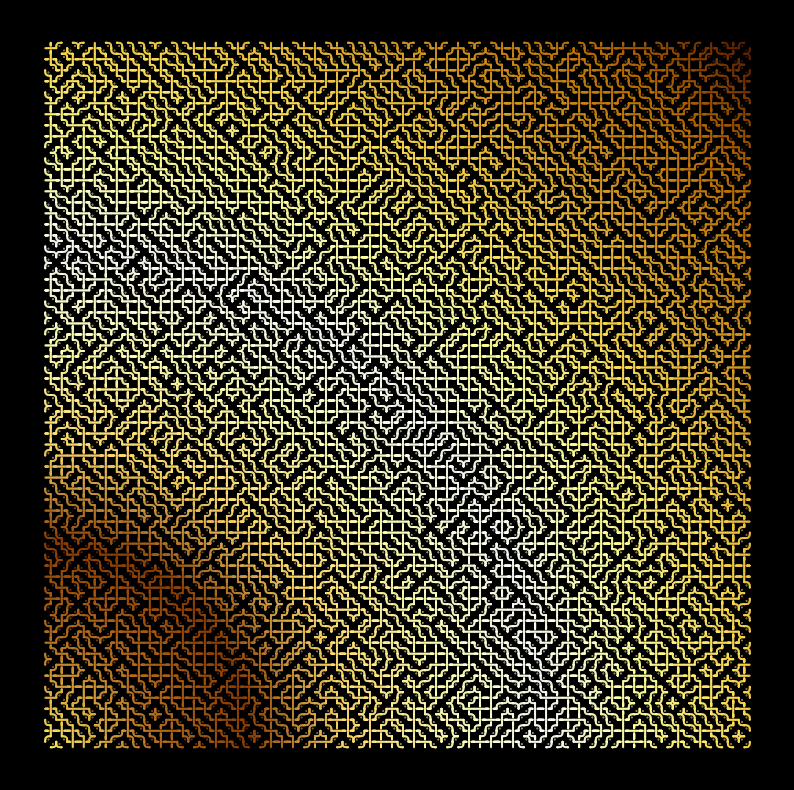

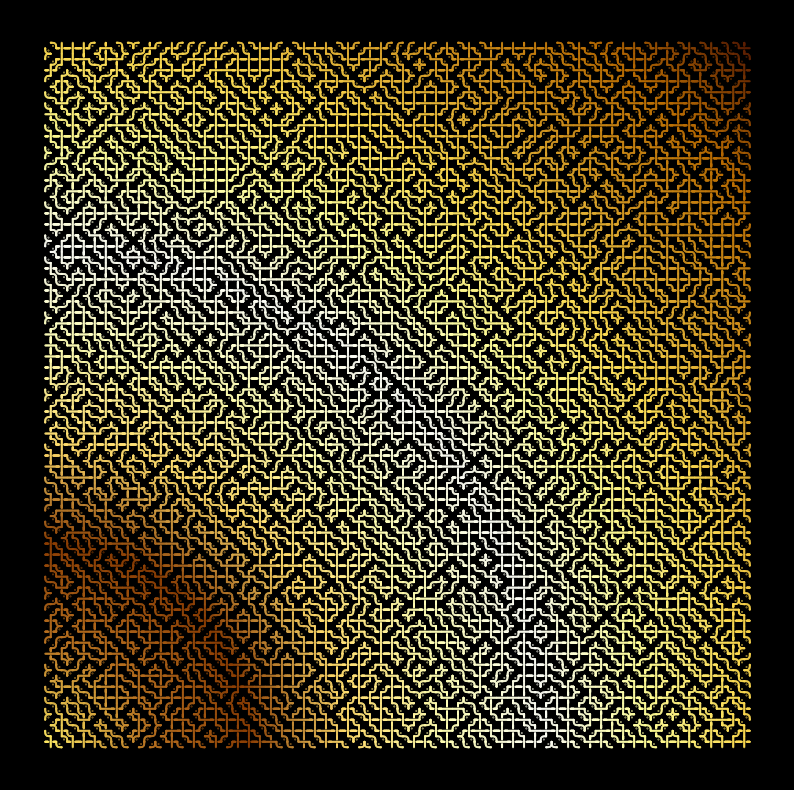

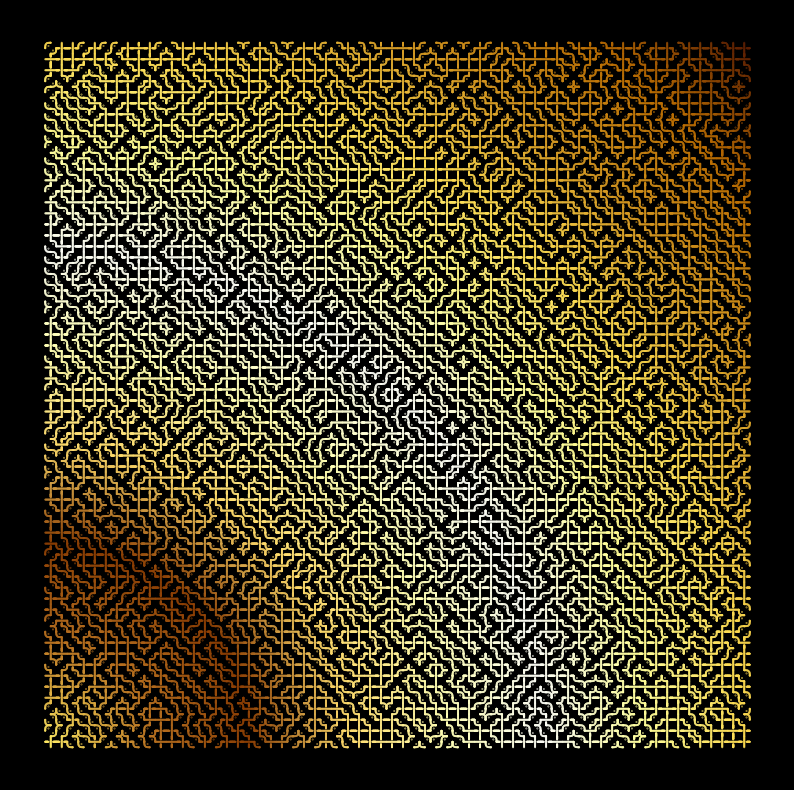

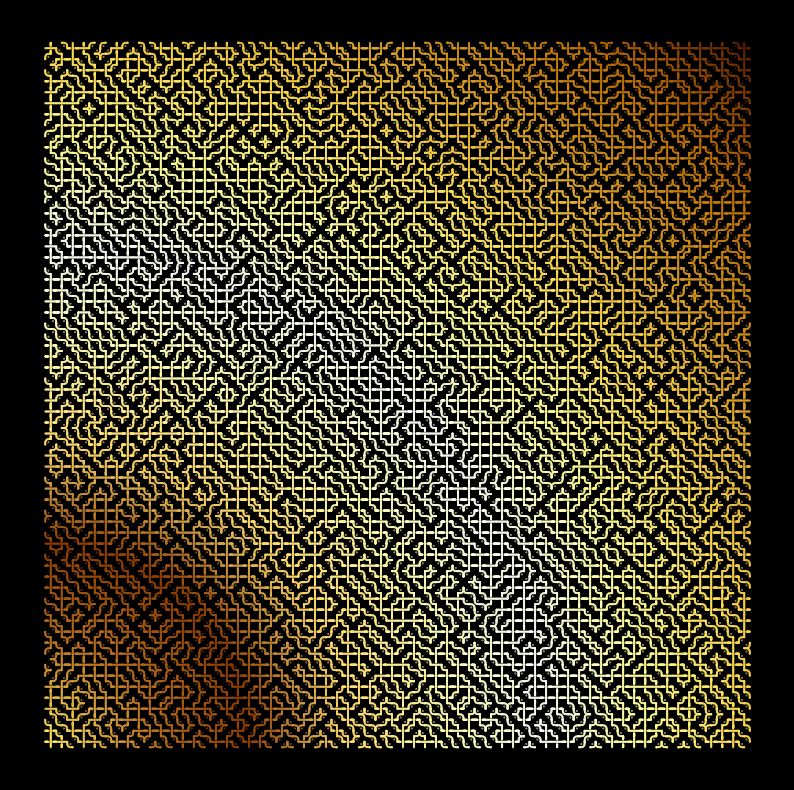

In [221]:
for j in range(10):
    seed=j
    mix=0.2+0.8*i/3
    N=2**6
    np.random.seed(seed)
    #order=gen_order(N,2**2,mix,seed)
    order=np.random.choice(a=2*[0]+[1]+2*[2]+[3],size=(N,N))
    Truchet_x,Truchet_y=Gen_Truchet(style_A_x,style_A_y, order,join=0.5).get_coords()
    f_tru_x=Truchet_x.reshape(-1)
    f_tru_y=Truchet_y.reshape(-1)
    #c=np.arange(len(f_tru_x))
    c=((f_tru_y**2+f_tru_x**2)**0.5*0.1)
    plt.figure(figsize=(10,10))
    plt.scatter(f_tru_x,f_tru_y,s=10/N, c=c,cmap=gold_2,alpha=0.8)
    plt.axis('equal')
    plt.axis('off')
    plt.savefig('Truchet_trial/Truchet_seed={0}_d={1}.png'.format(seed,N),dpi=300, bbox_inches='tight')
    #plt.savefig('Truchet_trial/Truchet_seed={0}_mix={1}_d={2}.png'.format(seed,mix,N),dpi=300, bbox_inches='tight')


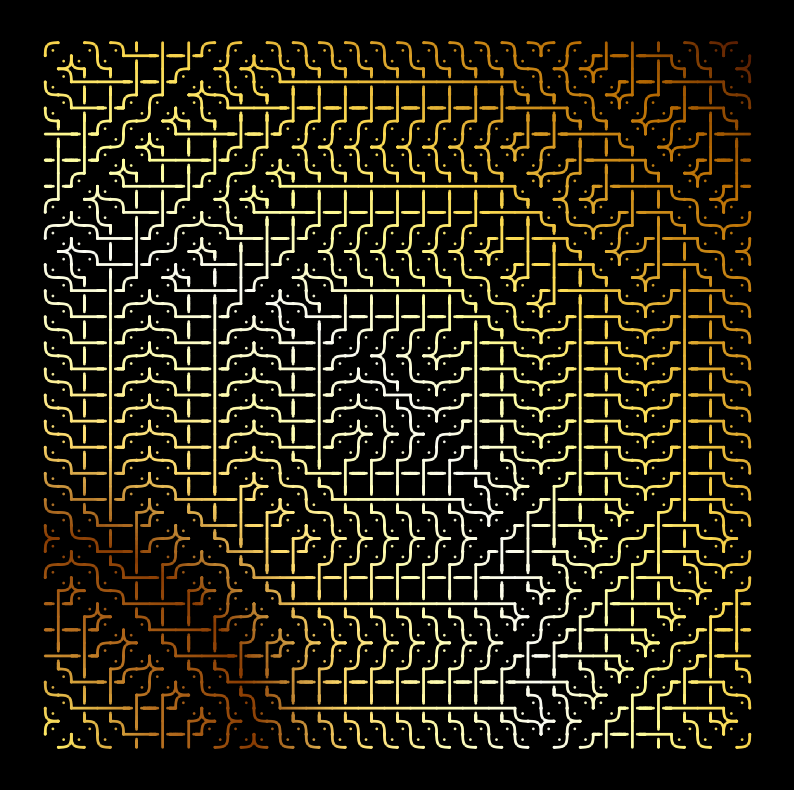

In [13]:
plt.rcParams['figure.facecolor'] = 'black' 
plt.figure(figsize=(10,10))
size=27
np.random.seed(1)
nn=np.arange(size**2).reshape(size,size)
#order=((4*(nn)**2)%15)%4
#order=np.random.choice(a=2*[0]+[1]+2*[2]+[3],size=(size,size))
xx=nn%size-(size-1)/2
yy=nn//size-(size-1)/2
order=(((xx**2+yy**2)**0.5-1)%4).astype(int)
#order=np.random.choice(a=[0,1],size=(size,size))

Truchet_x,Truchet_y=Gen_Truchet(style_A_x,style_A_y, order,join=0.5).get_coords()
#plt.plot(Truchet_x.T,Truchet_y.T,color='white',linewidth=1)


f_tru_x=Truchet_x.reshape(-1)
f_tru_y=Truchet_y.reshape(-1)
l=len(f_tru_x)
#c=np.arange(l)

res=60
noise_x=np.random.rand(l)
noise_y=np.random.rand(l)
# c_x=(np.interp(np.arange(l)/res,np.arange(l//res),0.2*np.random.rand(l//res)))
# c_y=(np.interp(np.arange(l)/res,np.arange(l//res),0.2*np.random.rand(l//res)))
#noise = generate_perlin_noise_2d([l,1], [l//6,1])
#plt.scatter(Truchet_x.T,Truchet_y.T,s=5, c=(Truchet_x.T**2+Truchet_y.T**2)**0.5,cmap=gold)
#c=(((np.cos(0.11*f_tru_x)+0*c_x)**2+(np.cos(f_tru_y*0.5*np.pi)+0*c_y)**2)**0.5)
c=((f_tru_y**2+f_tru_x**2)**0.5*0.1)
plt.scatter(f_tru_x+0.0*noise_x,f_tru_y+0.0*noise_y,s=1, c=c,cmap=gold_2,alpha=0.9)
plt.axis('equal')
plt.axis('off')
plt.show()


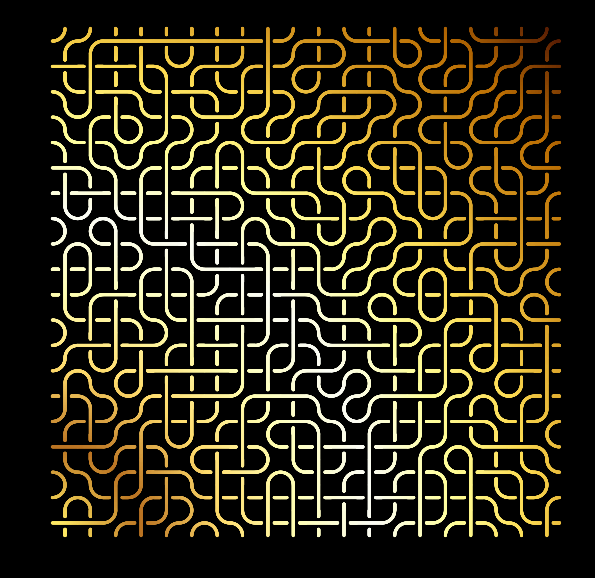

In [9]:
plt.rcParams['figure.facecolor'] = 'black' 
plt.figure(figsize=(10,10))
size=10*2
#np.random.seed()

#order=((4*(np.arange(size**2).reshape(size,size))**2)%11)
order=np.random.choice(a=[0,1,2,3],size=(size,size))
Truchet_x,Truchet_y=Gen_Truchet(style_A_x,style_A_y, order,join=0).get_coords()
#plt.plot(Truchet_x.T,Truchet_y.T,color='white',linewidth=1)


f_tru_x=Truchet_x.reshape(-1)
f_tru_y=Truchet_y.reshape(-1)
l=len(f_tru_x)
res=60
noise_x=np.random.rand(l)
noise_y=np.random.rand(l)
c_x=(np.interp(np.arange(l)/res,np.arange(l//res),0.2*np.random.rand(l//res)))
c_y=(np.interp(np.arange(l)/res,np.arange(l//res),0.2*np.random.rand(l//res)))
#noise = generate_perlin_noise_2d([l,1], [l//6,1])
#plt.scatter(Truchet_x.T,Truchet_y.T,s=5, c=(Truchet_x.T**2+Truchet_y.T**2)**0.5,cmap=gold)
#c=(((np.cos(0.11*f_tru_x)+0*c_x)**2+(np.cos(f_tru_y*0.5*np.pi)+0*c_y)**2)**0.5)
c=(f_tru_y**2+f_tru_x**2)**0.5
plt.scatter(f_tru_x+0.0*noise_x,f_tru_y+0.0*noise_y,s=4, c=c,cmap=gold)
plt.axis('equal')
plt.axis('off')
plt.show()


In [751]:
l

87300

In [715]:
10*(noise_x**2+noise_y**2)**0.5

array([7.4709349 , 8.56925716, 9.59104639, ..., 7.08166277, 7.08164714,
       7.08175372])